# Premise

Who we are: Aqua Partners - Public Sector Consulting Firm specialized in economic development

Stakeholder: Tanzanian Government

Objective: Assist the government in improving the funcitonality of future waterpumps installed in the country using the existing range of infrastructure 

Dataset: Status and features of waterpumps installed in Tanzania to provide water supply to cities / villages



# Definitions 

amount_tsh - Total static head (amount water available to waterpoint) / date_recorded - The date the row was entered

funder - Who funded the well / gps_height - Altitude of the well

installer - Organization that installed the well / longitude - GPS coordinate 

latitude - GPS coordinate / wpt_name - Name of the waterpoint if there is one

basin - Geographic water basin / subvillage - Geographic location / region - Geographic location

region_code - Geographic location (coded)/ district_code - Geographic location (coded)

lga - Geographic location / ward - Geographic location /population - Population around the well

public_meeting - True/False / recorded_by - Group entering this row of data / scheme_management - Who operates the waterpoint

scheme_name - Who operates the waterpoint / permit - If the waterpoint is permitted

construction_year - Year the waterpoint was constructed / extraction_type - The kind of extraction the waterpoint uses

extraction_type_group - The kind of extraction the waterpoint uses / extraction_type_class - The kind of extraction the waterpoint uses

management - How the waterpoint is managed / management_group - How the waterpoint is managed

payment - What the water costs / payment_type - What the water costs

water_quality - The quality of the water / quality_group - The quality of the water

quantity - The quantity of water / quantity_group - The quantity of water

source - The source of the water / source_type - The source of the water

source_class - The source of the water / waterpoint_type - The kind of waterpoint

waterpoint_type_group - The kind of waterpoint

# Package Installation

In [52]:
import pandas as pd
import numpy as np
import geopandas as geo
import warnings
warnings.filterwarnings('ignore')

from IPython.display import Image  
from pydotplus import graph_from_dot_data
from IPython.display import display

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%load_ext autoreload
%autoreload 2

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier 
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV,StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, precision_recall_curve
from sklearn.svm import SVC
from sklearn.linear_model import RidgeClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline
from mlxtend.classifier import StackingClassifier
from mlxtend.plotting import plot_decision_regions
import matplotlib.gridspec as gridspec
import itertools
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from xgboost import XGBClassifier
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB


from ml_repo import scores
from ml_repo import roc_plot
from ml_repo import annot
from ml_repo import plotfeatures
from ml_repo import print_metrics
from ml_repo import opt_plots

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Data Observation

The labels in this dataset are simple. There are three possible values:
functional - the waterpoint is operational and there are no repairs needed
functional needs repair - the waterpoint is operational, but needs repairs
non functional - the waterpoint is not operational

In [2]:
X = pd.read_csv('Data/X.csv')
y = pd.read_csv('Data/Y.csv')
X1 = pd.read_csv('Data/X1.csv')
df = pd.merge(y,X,on='id')

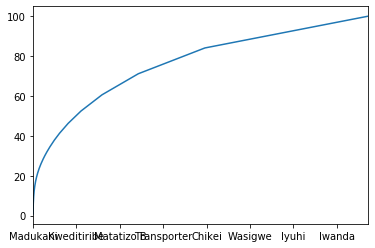

In [3]:
(df.subvillage.value_counts(normalize = True)*100).cumsum().plot()

In [4]:
df['installer'].fillna('other', inplace = True)
df['funder'].fillna('other', inplace = True)
df['public_meeting'].fillna('False', inplace = True)
df['scheme_management'].fillna('other',inplace = True)
df['permit'].fillna('False', inplace = True)
df.drop(columns =['recorded_by', 'extraction_type_group','extraction_type_class', 'payment', 'quantity_group', 'source', 'source_class', 'id', 'num_private', 'quantity_group','waterpoint_type_group', 'wpt_name', 'scheme_name', 'amount_tsh'], inplace = True)
df['region_and_code'] = df['region'] + df['region_code'].map(str)
df.drop(columns = ['region', 'region_code'], inplace = True)
df.population.replace(0,df.groupby(['district_code']).population.mean(), inplace = True)
df.status_group.replace('functional needs repair','non functional', inplace = True)

In [5]:
i = df.construction_year.median()
df.construction_year.replace(0,i,inplace=True)

j = df.groupby(['basin']).gps_height.mean()
df.gps_height.replace(0,j, inplace = True)



In [6]:
df['year'] = df.date_recorded.str[:4]
df['month'] = df.date_recorded.str[-4]
df.drop(columns = ['date_recorded'], inplace = True)
df['length_operation'] = df.year.map(int) - df.construction_year.map(int)

In [7]:
cols = [i for i in df.columns if type(df[i].iloc[0]) == str]
df[cols] = df[cols].where(df[cols].apply(lambda x: x.map(x.value_counts())) > 50,"other")

## Resampling - under sampling to fix class imbalance

In [8]:
df.status_group.value_counts()

functional        32259
non functional    27141
Name: status_group, dtype: int64

In [9]:
count_class_0, count_class_1 = df.status_group.value_counts()

In [10]:
df_class_0 = df[df['status_group'] == 'functional']
df_class_1 = df[df['status_group'] == 'non functional']

In [11]:
df_class_0_under = df_class_0.sample(count_class_1)
df_balanced = pd.concat([df_class_0_under, df_class_1], axis = 0)

In [12]:
df_balanced.status_group.value_counts()

non functional    27141
functional        27141
Name: status_group, dtype: int64

# Data Transformation

In [13]:
scaler = MinMaxScaler()
conti = df_balanced.loc[:,['population', 'gps_height', 'length_operation']]
df_balanced[['population', 'gps_height', 'length_operation']] = scaler.fit_transform(df_balanced[['population', 'gps_height', 'length_operation']])
df_balanced

,status_group,funder,gps_height,installer,longitude,latitude,basin,subvillage,district_code,lga,...,payment_type,water_quality,quality_group,quantity,source_type,waterpoint_type,region_and_code,year,month,length_operation
26454,functional,Dh,0.031469,DH,37.338240,-6.380162,Wami / Ruvu,other,1,Kilosa,...,per bucket,salty,salty,insufficient,borehole,communal standpipe,Morogoro5,2011,4,0.551724
56258,functional,Government Of Tanzania,0.608392,District council,37.588301,-3.057749,Internal,other,1,Rombo,...,never pay,soft,good,seasonal,rainwater harvesting,communal standpipe,Kilimanjaro3,2013,2,0.224138
42736,functional,Kkkt,0.679720,KKKT,36.167614,-7.374394,Rufiji,other,7,Kilolo,...,never pay,soft,good,enough,borehole,hand pump,Iringa11,2011,3,0.103448
50677,functional,other,0.031469,other,33.864110,-8.828171,Rufiji,other,7,Mbarali,...,never pay,soft,good,enough,shallow well,hand pump,Mbeya12,2011,4,0.517241
31689,functional,Dhv,0.154895,DWE,36.759865,-8.956900,Rufiji,other,4,Ulanga,...,monthly,soft,good,enough,shallow well,hand pump,Morogoro5,2011,3,0.379310
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59382,non functional,Ces(gmbh),0.515035,DWE,37.454759,-3.323599,Pangani,other,4,Moshi Rural,...,per bucket,soft,good,enough,spring,communal standpipe,Kilimanjaro3,2013,8,0.172414
59384,non functional,Concern,0.031469,other,30.667805,-2.483710,Lake Victoria,Songambele,30,Ngara,...,never pay,soft,good,insufficient,spring,communal standpipe,Kagera18,2011,7,0.517241
59391,non functional,Government Of Tanzania,0.220280,Government,38.044070,-4.272218,Pangani,other,3,Same,...,never pay,soft,good,enough,river/lake,communal standpipe,Kilimanjaro3,2013,8,0.879310
59392,non functional,Government Of Tanzania,0.031469,Government,33.009440,-8.520888,Lake Rukwa,other,1,Chunya,...,never pay,soft,good,enough,spring,communal standpipe,Mbeya12,2011,4,0.517241


In [14]:
df_balanced.columns

Index(['status_group', 'funder', 'gps_height', 'installer', 'longitude',
       'latitude', 'basin', 'subvillage', 'district_code', 'lga', 'ward',
       'population', 'public_meeting', 'scheme_management', 'permit',
       'construction_year', 'extraction_type', 'management',
       'management_group', 'payment_type', 'water_quality', 'quality_group',
       'quantity', 'source_type', 'waterpoint_type', 'region_and_code', 'year',
       'month', 'length_operation'],
      dtype='object')

In [15]:


y = df_balanced['status_group']

X1 = df_balanced.loc[:, ['funder', 'gps_height', 'installer',
       'basin', 'subvillage', 'district_code', 'lga', 'ward',
       'population', 'public_meeting', 'scheme_management', 'permit',
       'construction_year', 'extraction_type', 'management',
       'management_group', 'payment_type', 'water_quality', 'quality_group',
       'quantity', 'source_type', 'waterpoint_type', 'region_and_code', 'year',
       'month', 'length_operation']]



y1 = pd.get_dummies(y, prefix = ['status_group'])
y1 = y1.iloc[:,0]
X1.shape

(54282, 26)

In [16]:
X1_cat = X1.drop(conti.columns,axis=1)
X1_cont = X1.loc[:,['population', 'gps_height', 'length_operation']]

In [17]:
X1_cat[['district_code','construction_year']] = X1_cat[['district_code','construction_year']].astype(str)

In [18]:
X1_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54282 entries, 26454 to 59394
Data columns (total 23 columns):
funder               54282 non-null object
installer            54282 non-null object
basin                54282 non-null object
subvillage           54282 non-null object
district_code        54282 non-null object
lga                  54282 non-null object
ward                 54282 non-null object
public_meeting       54282 non-null object
scheme_management    54282 non-null object
permit               54282 non-null object
construction_year    54282 non-null object
extraction_type      54282 non-null object
management           54282 non-null object
management_group     54282 non-null object
payment_type         54282 non-null object
water_quality        54282 non-null object
quality_group        54282 non-null object
quantity             54282 non-null object
source_type          54282 non-null object
waterpoint_type      54282 non-null object
region_and_code      54282 

In [19]:
X1_cat = pd.get_dummies(X1_cat)

In [20]:
X1_cat.head()

,funder_0,funder_Adb,funder_Adra,funder_African,funder_Aict,funder_Amref,funder_Anglican Church,funder_Bsf,funder_Caritas,funder_Cdtf,...,month_0,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9
26454,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
56258,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
42736,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
50677,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
31689,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [21]:
X = pd.concat([X1_cont, X1_cat], axis=1)

In [22]:
X.head()

,population,gps_height,length_operation,funder_0,funder_Adb,funder_Adra,funder_African,funder_Aict,funder_Amref,funder_Anglican Church,...,month_0,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9
26454,0.032787,0.031469,0.551724,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
56258,0.000033,0.608392,0.224138,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
42736,0.001639,0.679720,0.103448,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
50677,0.000000,0.031469,0.517241,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
31689,0.008197,0.154895,0.379310,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


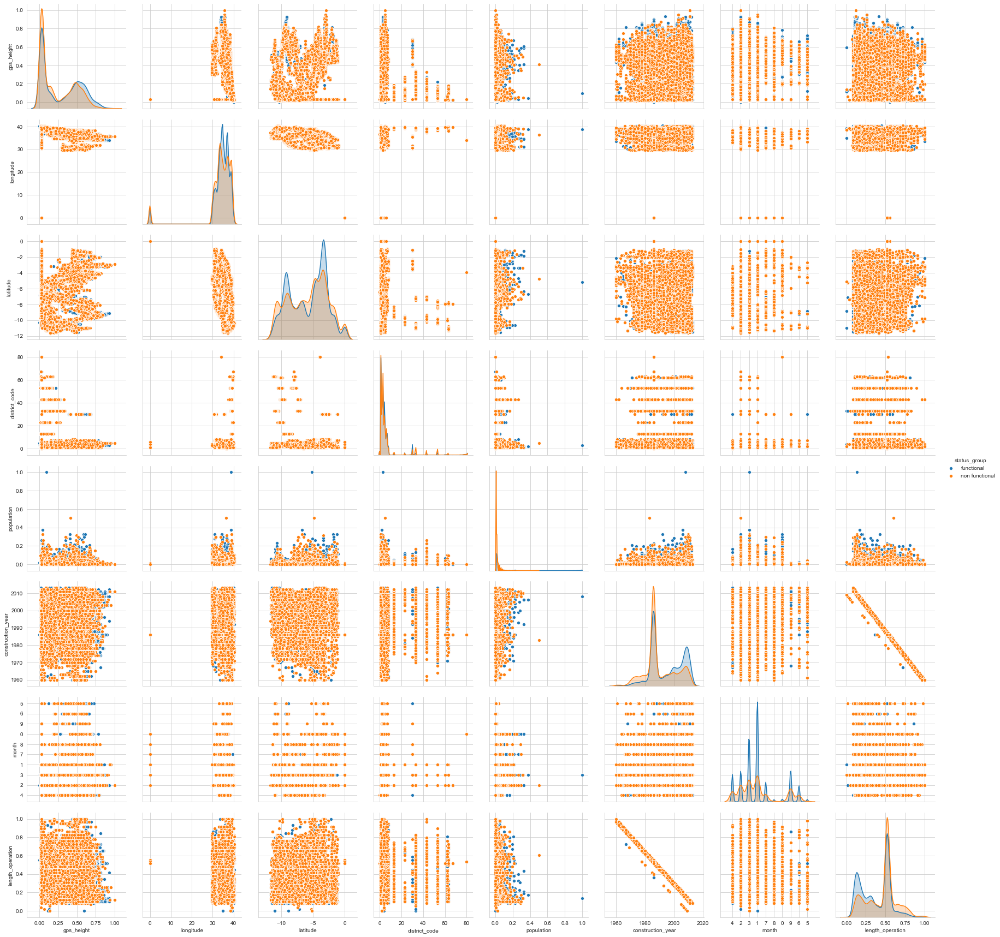

In [23]:
plt.close();
sns.set_style("whitegrid");
sns.pairplot(df_balanced, hue="status_group", size=3);
plt.show()

# Initial split of DataSet (Train / Test set)

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y1, random_state=42, test_size=0.2)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.2,random_state=42) 
skf = StratifiedKFold(n_splits=5,random_state=42)

In [25]:
y_train

51874    0
33263    1
55658    1
466      0
34103    0
        ..
56113    1
13319    0
36477    1
53919    1
48364    1
Name: ['status_group']_functional, Length: 34740, dtype: uint8

# Overall Baseline Model - Decision Tree

## Baseline method

train roc_auc: 1.0 val/test roc_auc: 0.78


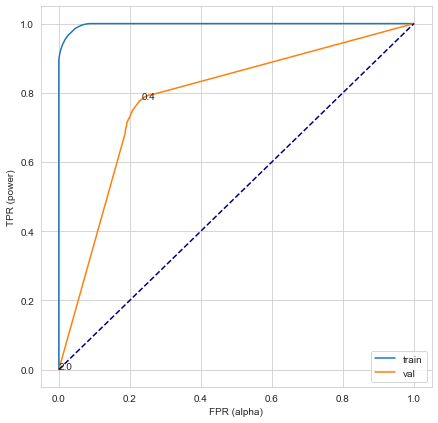

CPU times: user 6.45 s, sys: 887 ms, total: 7.34 s
Wall time: 7.86 s


In [26]:
%%time

from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(random_state=42)
dtc.fit(X_train,y_train)

scores(dtc,X_train,X_val,y_train,y_val)
roc_plot(dtc,X_train,y_train,X_val,y_val)

In [27]:
print ('train accuracy:', dtc.score(X_train, y_train),'//','val accuracy:', dtc.score(X_val, y_val))

train accuracy: 0.9698906160046057 // val accuracy: 0.7717904432930339


In [28]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(dtc, out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = np.unique(y).astype(str),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png 
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

## Example of DT - limited max depth

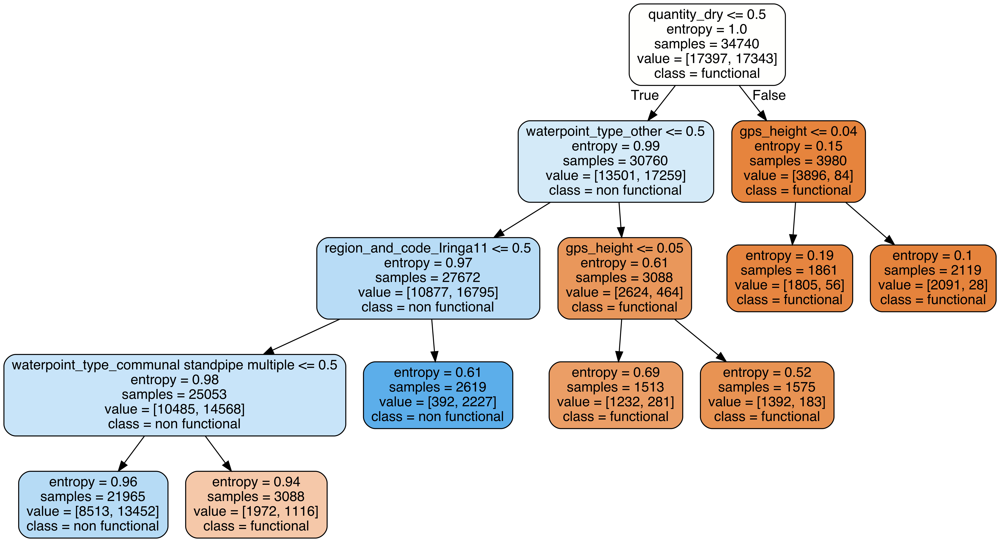

In [29]:
clf = DecisionTreeClassifier(criterion='entropy', max_depth = 4, min_samples_leaf = 1500)
clf.fit(X_train, y_train) #encoded categorical variable using pd.get_dummies()

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(clf, out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = np.unique(y).astype(str),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png 
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

## GridSearch CV

train roc_auc: 0.92 val/test roc_auc: 0.86
{'criterion': 'entropy', 'max_depth': 40, 'min_samples_leaf': 15}
CPU times: user 4.19 s, sys: 646 ms, total: 4.84 s
Wall time: 1min 16s


Text(0.5, 1, 'ROC_AUC - Validation')

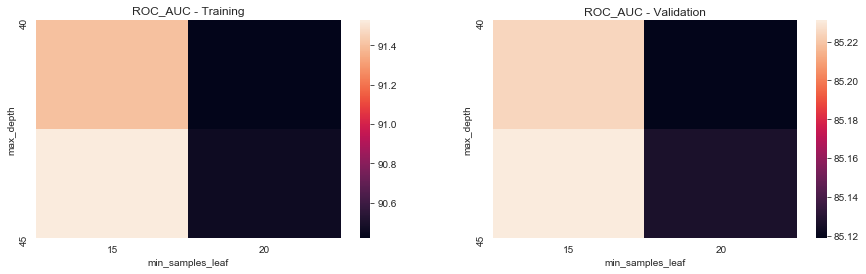

In [30]:
%%time

clf = DecisionTreeClassifier()
param_grid = {'criterion':['gini','entropy'], 'max_depth': [40,45], 'min_samples_leaf':[15,20]}
opt_model = GridSearchCV(clf,param_grid,cv=skf,scoring='roc_auc',return_train_score=True,n_jobs=-1)
opt_model.fit(X_train, y_train)

best_model = opt_model.best_estimator_
scores(best_model,X_train,X_val,y_train,y_val)

print(opt_model.best_params_)

opt = pd.DataFrame(opt_model.cv_results_)
cols = [col for col in opt.columns if ('mean' in col or 'std' in col) and 'time' not in col]
params = pd.DataFrame(list(opt.params))
opt = pd.concat([params,opt[cols]],axis=1,sort=False)

plt.figure(figsize=[15,4])
plt.subplot(121)
sns.heatmap(pd.pivot_table(opt,index='max_depth',columns='min_samples_leaf',values='mean_train_score')*100)
plt.title('ROC_AUC - Training')
plt.subplot(122)
sns.heatmap(pd.pivot_table(opt,index='max_depth',columns='min_samples_leaf',values='mean_test_score')*100)
plt.title('ROC_AUC - Validation')

In [31]:
print ('train accuracy:', opt_model.score(X_train, y_train),'//','val accuracy:', opt_model.score(X_val, y_val))

train accuracy: 0.9176124736118304 // val accuracy: 0.8607160536201491


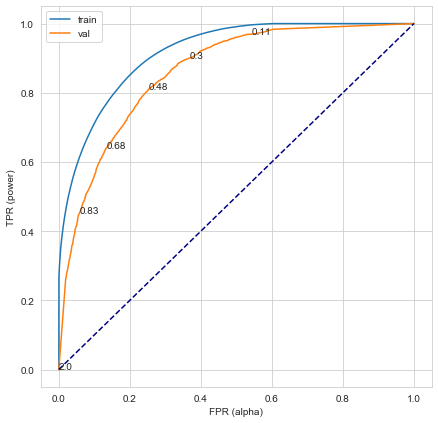

In [32]:
roc_plot(opt_model,X_train,y_train,X_val,y_val)

# Model - Logistic Regression 

## Baseline method

In [33]:
%%time

logreg = LogisticRegression(fit_intercept = False, C = 1e15, solver='liblinear')
model_log = logreg.fit(X_train, y_train)
model_log

CPU times: user 13.2 s, sys: 331 ms, total: 13.5 s
Wall time: 13.6 s


LogisticRegression(C=1000000000000000.0, class_weight=None, dual=False,
                   fit_intercept=False, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [34]:
train_prob = model_log.predict_proba(X_train)[:,1]
val_prob = model_log.predict_proba(X_val)[:,1]

In [35]:
print ('train accuracy:', model_log.score(X_train, y_train),'//','val accuracy:', model_log.score(X_val, y_val))

train accuracy: 0.790616004605642 // val accuracy: 0.7776626367299942


train roc_auc: 0.88 val/test roc_auc: 0.86


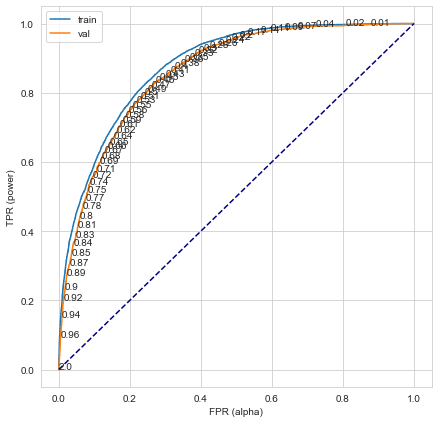

In [36]:
scores(model_log,X_train,X_val,y_train,y_val)
roc_plot(model_log,X_train,y_train,X_val,y_val)

In [37]:
param_grid = [{'C': np.logspace(0,4,10), 'penalty': ['l1','l2']}]
log_clf = LogisticRegression(class_weight='balanced')

In [38]:
grid_logistic = GridSearchCV(log_clf, param_grid, cv=skf, scoring='roc_auc', return_train_score=True)

# Model - Random Forest

## Baseline method

In [39]:
forest = RandomForestClassifier(n_estimators = 500, max_depth = 10)
forest.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [40]:
forest.predict(X_val)

array([0, 0, 1, ..., 1, 0, 0], dtype=uint8)

In [41]:
print('train accuracy:',forest.score(X_train, y_train),'//','validation accuracy:',forest.score(X_val, y_val))

train accuracy: 0.778209556706966 // validation accuracy: 0.7614277489925159


train roc_auc: 0.87 val/test roc_auc: 0.85


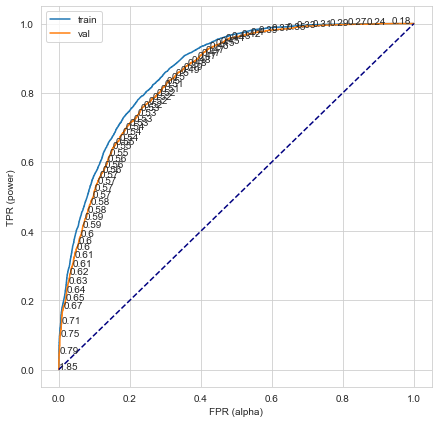

In [42]:
scores(forest,X_train,X_val,y_train,y_val)
roc_plot(forest,X_train,y_train,X_val,y_val)

In [45]:
pipe_rf = Pipeline([
            ('clf', RandomForestClassifier(random_state = 42))])

# Set grid search params
param_grid_forest = [ 
  {'clf__n_estimators': [150],
   'clf__max_depth': [5,50,100],  
   'clf__min_samples_leaf':[5,50,100],  
   'clf__min_samples_split':[5,50,100]
  }
]

# Construct grid search
gs_rf = GridSearchCV(estimator=pipe_rf,
            param_grid=param_grid_forest,
            scoring='accuracy',
            verbose=2, return_train_score = True)


# Fit using grid search
%time gs_rf.fit(X_train, y_train)

# Best accuracy
print('Best accuracy: %.3f' % gs_rf.best_score_)

# Best params
print('\nBest params:\n', gs_rf.best_params_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150, total=   3.7s
[CV] clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.2s remaining:    0.0s


[CV]  clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150, total=   3.4s
[CV] clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150, total=   4.1s
[CV] clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150, total=   4.0s
[CV] clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=5, clf__n_estimators=150, total=   4.3s
[CV] clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=50, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=5, clf__min_samples_split=50, clf__n_estimators=150, total=   3.6s
[CV] clf__max_depth=5, clf__min_samples_leaf=5, cl

[CV]  clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150, total=   3.3s
[CV] clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150, total=   3.3s
[CV] clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150, total=   3.3s
[CV] clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150, total=   3.3s
[CV] clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150 
[CV]  clf__max_depth=5, clf__min_samples_leaf=100, clf__min_samples_split=100, clf__n_estimators=150, total=   3.3s
[CV] clf__max_de

[CV]  clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=5, clf__n_estimators=150, total=   8.0s
[CV] clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150 
[CV]  clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150, total=   7.2s
[CV] clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150 
[CV]  clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150, total=   6.9s
[CV] clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150 
[CV]  clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150, total=   6.8s
[CV] clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150 
[CV]  clf__max_depth=50, clf__min_samples_leaf=100, clf__min_samples_split=50, clf__n_estimators=150, total=   8.0s
[CV] clf__max_dep

[CV]  clf__max_depth=100, clf__min_samples_leaf=50, clf__min_samples_split=100, clf__n_estimators=150, total=   9.9s
[CV] clf__max_depth=100, clf__min_samples_leaf=50, clf__min_samples_split=100, clf__n_estimators=150 
[CV]  clf__max_depth=100, clf__min_samples_leaf=50, clf__min_samples_split=100, clf__n_estimators=150, total=   9.0s
[CV] clf__max_depth=100, clf__min_samples_leaf=50, clf__min_samples_split=100, clf__n_estimators=150 
[CV]  clf__max_depth=100, clf__min_samples_leaf=50, clf__min_samples_split=100, clf__n_estimators=150, total=   9.9s
[CV] clf__max_depth=100, clf__min_samples_leaf=100, clf__min_samples_split=5, clf__n_estimators=150 
[CV]  clf__max_depth=100, clf__min_samples_leaf=100, clf__min_samples_split=5, clf__n_estimators=150, total=   7.8s
[CV] clf__max_depth=100, clf__min_samples_leaf=100, clf__min_samples_split=5, clf__n_estimators=150 
[CV]  clf__max_depth=100, clf__min_samples_leaf=100, clf__min_samples_split=5, clf__n_estimators=150, total=   7.3s
[CV] clf__m

[Parallel(n_jobs=1)]: Done 135 out of 135 | elapsed: 21.6min finished


CPU times: user 20min 40s, sys: 56.8 s, total: 21min 37s
Wall time: 22min 2s
Best accuracy: 0.795

Best params:
 {'clf__max_depth': 100, 'clf__min_samples_leaf': 5, 'clf__min_samples_split': 5, 'clf__n_estimators': 150}


In [53]:
RANDOM_SEED = 42

rf_clf = RandomForestClassifier(n_estimators=10, random_state=RANDOM_SEED)
et_clf = ExtraTreesClassifier(n_estimators=5, random_state=RANDOM_SEED)
rg_clf = RidgeClassifier(alpha=0.1, random_state=RANDOM_SEED)
lr_clf = LogisticRegression(C=20000, penalty='l2', random_state=RANDOM_SEED)
dt_clf = DecisionTreeClassifier(criterion='entropy', max_depth=40,min_samples_leaf=15, random_state=RANDOM_SEED)
adab_clf = AdaBoostClassifier(n_estimators=100)
lr = LogisticRegression(random_state=RANDOM_SEED) # meta classifier

sclf = StackingClassifier(classifiers=[rf_clf, et_clf, rg_clf, lr_clf, dt_clf, adab_clf], meta_classifier=lr)

classifier_array = [rf_clf, et_clf, rg_clf, lr_clf, dt_clf, adab_clf, sclf]
labels = [clf.__class__.__name__ for clf in classifier_array]

acc_list = []
var_list = []

for clf, label in zip(classifier_array, labels):
    cv_scores = model_selection.cross_val_score(clf, X_train, y_train, cv=skf, scoring='accuracy')
    print("Accuracy: %0.4f (+/- %0.4f) [%s]" % (cv_scores.mean(), cv_scores.std(), label))
    acc_list.append(np.round(cv_scores.mean(),4))
    var_list.append(np.round(cv_scores.std(),4))

Accuracy: 0.7868 (+/- 0.0061) [RandomForestClassifier]
Accuracy: 0.7812 (+/- 0.0048) [ExtraTreesClassifier]
Accuracy: 0.7718 (+/- 0.0070) [RidgeClassifier]
Accuracy: 0.7731 (+/- 0.0062) [LogisticRegression]
Accuracy: 0.7700 (+/- 0.0035) [DecisionTreeClassifier]
Accuracy: 0.7586 (+/- 0.0117) [AdaBoostClassifier]
Accuracy: 0.7812 (+/- 0.0048) [StackingClassifier]


In [54]:
rf_clf = RandomForestClassifier(n_estimators=10, random_state=RANDOM_SEED)
et_clf = ExtraTreesClassifier(n_estimators=5, random_state=RANDOM_SEED)
lr_clf = LogisticRegression(C=20000, penalty='l2', random_state=RANDOM_SEED)
dt_clf = DecisionTreeClassifier(criterion='entropy', max_depth=40,min_samples_leaf=15, random_state=RANDOM_SEED)
adab_clf = AdaBoostClassifier(n_estimators=100)
lr = LogisticRegression(random_state=RANDOM_SEED) # meta classifier
gnb_clf = GaussianNB()

#sclf = StackingClassifier(classifiers=[rf_clf, et_clf, knn_clf, svc_clf, rg_clf, lr_clf, dt_clf, adab_clf], use_probas=True, average_probas=False, meta_classifier=lr)
sclf = StackingClassifier(classifiers=[rf_clf, gnb_clf, lr_clf, et_clf, dt_clf, adab_clf], use_probas=True, average_probas=False, meta_classifier=lr)

classifier_array = [rf_clf, knn_clf, gnb_clf, lr_clf, et_clf, dt_clf, adab_clf, sclf]
labels = [clf.__class__.__name__ for clf in classifier_array]

for clf, label in zip(classifier_array, labels):
    cv_scores = model_selection.cross_val_score(clf, X, y, cv=3, scoring='accuracy')
    print("Accuracy: %0.4f (+/- %0.4f) [%s]" % (cv_scores.mean(), cv_scores.std(), label))

NameError: name 'knn_clf' is not defined